# Caravan-ESP: datos auxiliares
***

***Autor:** Jesús Casado Rodríguez*<br>
***Fecha:** 15-08-2023*<br>

**Introducción:**<br>
Para compilar los datos de Caravan son necesarias dos tablas:
* Una tabla con el ID, longitud, latitud, nombre y país de cada una de las estaciones. Las coordenadas deben de estar en el sistema WGS84 (EPSG:4326).
* Una tabla con la serie diaria de caudal específico de cada una de las estaciones.

Además, para publicar el conjunto de datos en Caravan es necesario incluir una capa de polígonos con la cuenca de cada una de las estaciones.

En este _notebook_ se cargan las estaciones seleccionadas para incluir en el conjunto de datos Caravan-ESP, y sus series de caudal diario. Las series de caudal se transforma en caudal específico (caudal dividido por área de la cuenca vertiente, mm/d) y se exportan para su posterior utilización en la generación de Caravan-ESP.

In [1]:
import os
os.environ['USE_PYGEOS'] = '0'
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
# import seaborn as sns
from datetime import datetime, timedelta
import xarray as xr
import geopandas as gpd
import cartopy.crs as ccrs
import cartopy.feature as cf
from tqdm.notebook import tqdm
import yaml
from pathlib import Path
import pickle
import random

from anuario_aforos import dividir_periodo_estudio, plot_caudal

In [46]:
from typing import List, Dict

## Configuración

In [2]:
with open("../conf/config.yml", "r", encoding='utf8') as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)

# ruta donde se ubican los datos del Anurio de Aforos
path_anuario = Path('../data/anuario_aforos/')
path_caravan = Path(cfg['rutas'].get('caravan', '../data/caravan/'))

# inicio y fin del periodo de estudio
start = cfg['periodo'].get('inicio', None)
end = cfg['periodo'].get('final', None)
start, end = [pd.to_datetime(i) for i in [start, end]]

# tamaño de las muestras de entrenamiento y validación
train_size = cfg.get('train_size', .6)
assert 0 < train_size <= 1., '"train_size" debe de ser un valor entre 0 y 1'
val_size = cfg.get('val_size', .2)
assert 0 < val_size <= 1., '"train_size" debe de ser un valor entre 0 y 1'
if train_size + val_size > 1:
    val_size = 1 - train_size
    print(f'El valor de "val_size" fue truncado a {val_size:.2f}')
seed = cfg.get('seed', 0)
random.seed(seed)

## Datos
### Atributos CARAVAN-ESP

In [3]:
# cargar tabla de atributos de Caravan
atributos = pd.read_csv(path_caravan / 'attributes/attributes.csv', index_col=0)
atributos.index = [id.split('_')[-1] for id in atributos.index]

print('nº de estaciones:\t{0}\nnº de atributos:\t{1}'.format(*atributos.shape))

nº de estaciones:	285
nº de atributos:	197


### Estaciones 

In [4]:
# cargar estaciones
estaciones = gpd.read_file(path_anuario / 'GIS/estaciones.shp')
estaciones.set_index('indroea', drop=True, inplace=True)
estaciones = estaciones.loc[atributos.index]

n_estaciones = estaciones.shape[0]
print('nº de estaciones en la capa de puntos:\t{0}'.format(n_estaciones))

nº de estaciones en la capa de puntos:	285


In [5]:
# exportar
estaciones.index.name = 'indroea'
estaciones.to_csv(path_caravan / f'stations_camelsesp_{n_estaciones}.csv', float_format='%.4f')

**Definir estaciones de entrenamiento y validación**

In [54]:
def dividir_estaciones(ids: List, cal: float = .7, val: float = .3, ruta: Path = None) -> Dict:
    """
    """

    n_stns = len(ids)
    
    assert 0 < cal <= 1, '"cal" debe de ser un valor entre 0 y 1.'
    assert 0 < val <= 1, '"val" debe de ser un valor entre 0 y 1.'

    if cal + val > 1:
        val = 1 - cal
        print(f'"val" fue truncado a {val:0.2f}')
    # definir las estaciones de evaluación
    if cal + val < 1.:
        test = 1 - cal - val
        n_test = int(n_stns * test)
        ids_test = random.sample(ids, n_test)
        ids = [id for id in ids if id not in ids_test]
    else:
        test = None
        ids_test = []
        
    # estaciones de validación
    n_val = int(n_stns * val)
    ids_val = random.sample(ids, n_val)
    
    # estaciones de entrenamiento
    ids_cal = [id for id in ids if id not in ids_val]
    
    assert (len(ids_cal) + len(ids_val) + len(ids_test)) == n_stns, 'La unión de las estaciones de calibración, validación y test tiene menos estaciones que la lista "ids" original.'

    basins = {'train': ids_cal, 'validation': ids_val}
    if test is not None:
        basins.update({'test': ids_test})
            
    # exportar los conjuntos de etaciones
    if ruta is not None:
        for key, ls in basins.items():
            with open(ruta / f'{key}_basins.txt', 'w') as file:
                for id in ls:
                    file.write(id + '\n')

    return basins

In [61]:
# crear listados de estaciones de entrenamiento, validación y evaluación
basins = dividir_estaciones(estaciones.index.to_list(), cal=train_size, val=val_size, ruta=path_caravan)

In [60]:
# # listado de estaciones
# ids = estaciones.index.to_list()

# # definir las estaciones de evaluación
# if train_size + val_size < 1.:
#     test_size = 1 - train_size - val_size
#     n_test = int(estaciones.shape[0] * test_size)
#     ids_test = random.sample(ids, n_test)
#     ids = [id for id in ids if id not in ids_test]
# else:
#     test_size = None
#     ids_test = []
    
# # estaciones de validación
# n_val = int(estaciones.shape[0] * val_size)
# ids_val = random.sample(ids, n_val)

# # estaciones de entrenamiento
# ids_cal = [id for id in ids if id not in ids_val]

# assert len(ids_cal) + len(ids_val) + len(ids_test) == estaciones.shape[0], 'La unión de las estaciones de calibración, '

# # exportar los conjuntos de etaciones
# basins = {'train': ids_cal, 'validation': ids_val}
# if test_size is not None:
#     basins.update({'test': ids_test})
# for key, ls in basins.items():
#     with open(path_caravan / f'{key}_basins.txt', 'w') as file:
#         for id in ls:
#             file.write(id + '\n')

In [69]:
cuencas = ['CANTABRICO', 'GALICIA', 'MINHO', 'DUERO', 'TAJO', 'EBRO']
# folder = [dir for dir in os.listdir('../models/') if cuenca.capitalize() in dir][0]
folder = 'CAMELS-ESP'
basins_cuenca = dividir_estaciones(estaciones.loc[estaciones.cuenca.isin(cuencas)].index.to_list(),
                                   cal=train_size,
                                   val=val_size,
                                   ruta=Path(f'../models/{folder}/'))

### Subcuencas

In [7]:
# cargar polígonos de las cuencas de Caravan
cuencas = gpd.read_file(path_anuario / 'GIS/subcuencas_epsg4326.shp')
cuencas.set_index('gauge_id', drop=True, inplace=True)

# recortar cuencas según la tabla de atributos
cuencas = cuencas.loc[estaciones.index, :]

# generar nuevos campos
cuencas['gauge_name'] = estaciones.lugar
cuencas['gauge_lat'] = estaciones.latwgs84
cuencas['gauge_lon'] = estaciones.longwgs84
cuencas['country'] = 'Spain'
cuencas['area_skm'] = cuencas.Shape_Area
cuencas.area_skm = cuencas.area_skm.astype(int)

# eliminar campos
cuencas.drop(['HydroID', 'Shape_Area'], axis=1, inplace=True)

# reordenar
cuencas = cuencas[['gauge_name', 'gauge_lat', 'gauge_lon', 'country', 'area_skm', 'geometry']]

n_cuencas = cuencas.shape[0]
print('nº de cuencas en la capa de polígonos:\t{0}'.format(n_cuencas))

nº de cuencas en la capa de polígonos:	285


In [8]:
# exportar
cuencas.to_file(path_caravan / f'catchments_camelsesp_{n_cuencas}.shp', driver='ESRI Shapefile')

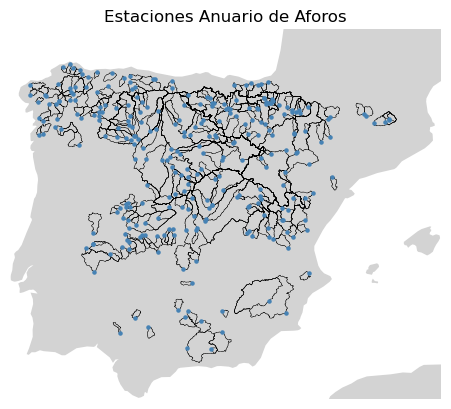

In [9]:
# plot estaciones
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(subplot_kw={'projection': proj})
ax.add_feature(cf.NaturalEarthFeature('physical', 'land', '50m', edgecolor=None, facecolor='lightgray'), zorder=0)
ax.set_extent([-9.5, 3.5, 36, 44.5], crs=proj)
cuencas.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.3);
ax.scatter(estaciones.geometry.x, estaciones.geometry.y, c='steelblue', s=5, alpha=1, label='Anuario')
ax.set_title('Estaciones Anuario de Aforos')
ax.axis('off');

# plt.savefig(f'{path_plots}estaciones.jpg', dpi=300, bbox_inches='tight');

### Caudal

In [10]:
# cargar series de caudal
caudal = pd.read_parquet(path_anuario / 'caudal.parquet', columns=estaciones.index)
caudal = caudal.loc[start:end,:]

**Series de caudal específico**

In [11]:
# calcular caudal específico
caudal_esp = caudal / estaciones.suprest * 3.6 * 24 # mm/d
caudal_esp.index.name = 'date'

In [12]:
# exportar
n_series = caudal_esp.shape[1]
# caudal_esp.to_parquet(path_out / f'specific_discharge_camelsesp_{n_series}.parquet')
caudal_esp.to_csv(path_caravan / f'specific_discharge_camelsesp_{n_series}.csv', float_format='%.2f')

**Definir periodos de calentamiento, validación y test**

In [16]:
# definir periodos de calibración, validación y evaluación para cada estación
periodos_ds = xr.Dataset({stn: dividir_periodo_estudio(caudal[stn], *estaciones.loc[stn, ['inicio', 'fin']]) for stn in caudal.columns}).to_array(dim='id')

# reorganizar el diccionario
periodos_dct = {}
for p in periodos_ds.period.data:
    periodos_dct[p] = {}
    for id in periodos_ds.id.data:
        periodos_dct[p][id] = {f'{key}_dates': [date] for key, date in periodos_ds.sel(period=p, id=id).to_pandas().to_dict().items()}

In [17]:
# guardar los periodos como pickle
for key, dct in periodos_dct.items():
    with open(path_caravan / f'{key}_periods.pkl', 'wb') as f:
        pickle.dump(dct, f)

***

array(['2007-10-01T00:00:00.000000000', '2003-10-01T00:00:00.000000000',
       '1999-01-01T00:00:00.000000000'], dtype='datetime64[ns]')

C:\GitHub\TFM\notebook\anuario_aforos.py:168: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=kwargs.get('figsize', (16, 4)))


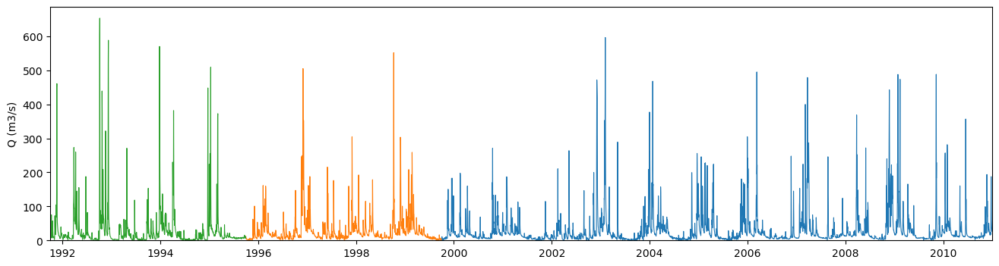

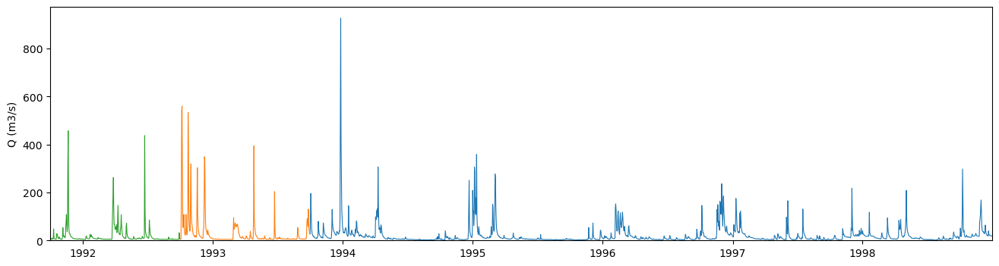

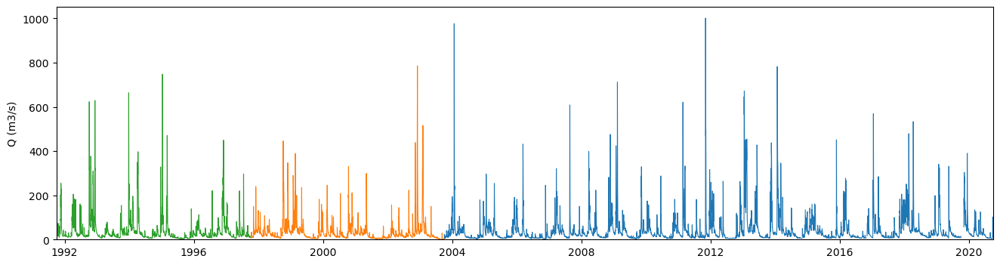

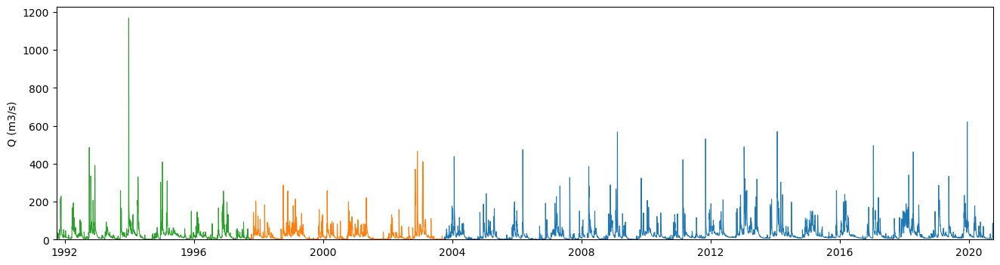

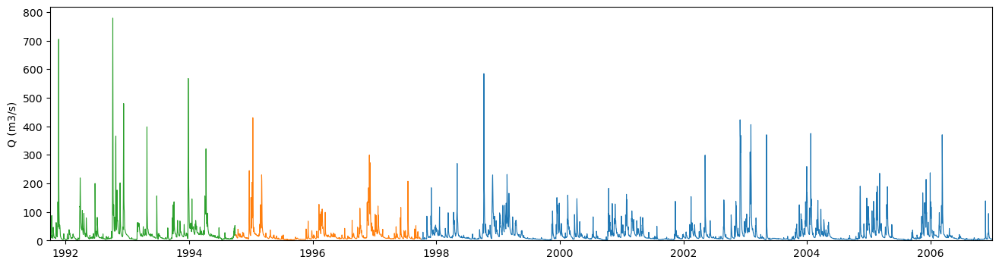

...

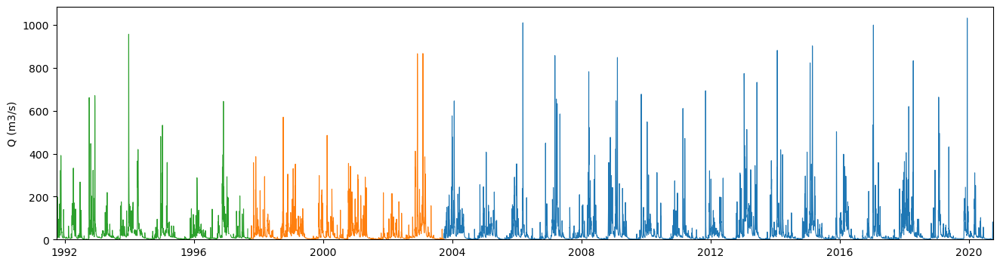

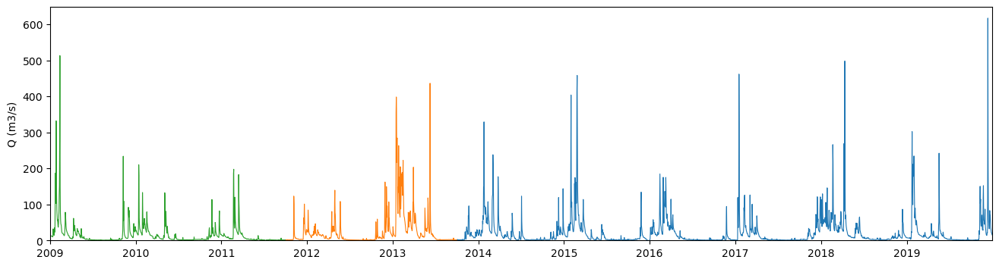

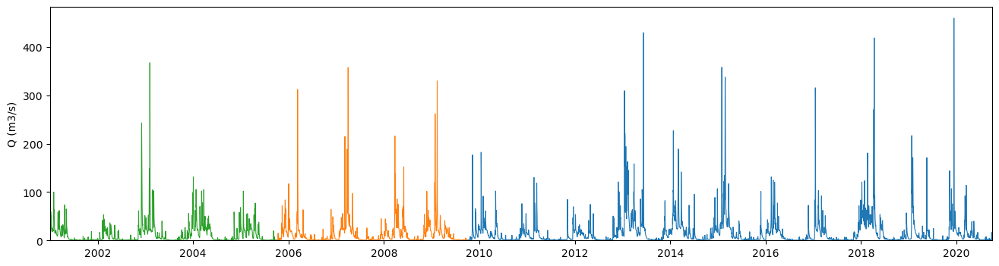

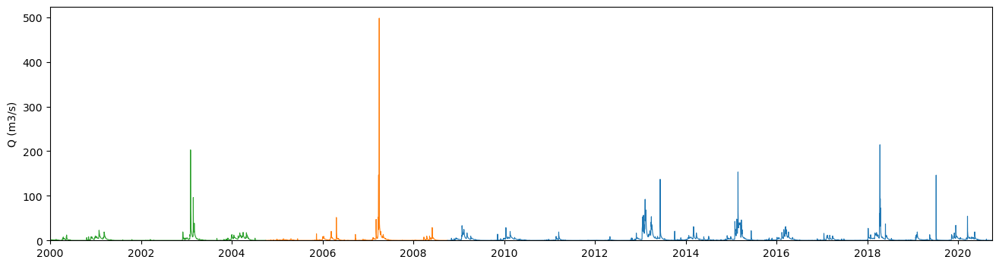

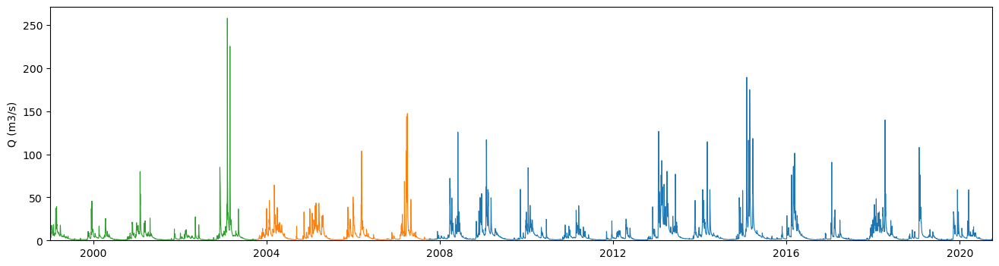

In [25]:
for id in caudal_esp.columns:
    plot_caudal(caudal_esp[id],
                inicios=periodos_ds.sel(id=id, date='start').data,
                finales=periodos_ds.sel(id=id, date='end').data,
                save=f'hidrogramas/{id:04}.jpg')

In [ ]:
4207, 9030

In [70]:
stn = '4207' # '9030' #'4207'

In [71]:
estaciones.loc[stn, ['inicio', 'fin']]

inicio    1991.0
fin       2003.0
Name: 4207, dtype: object

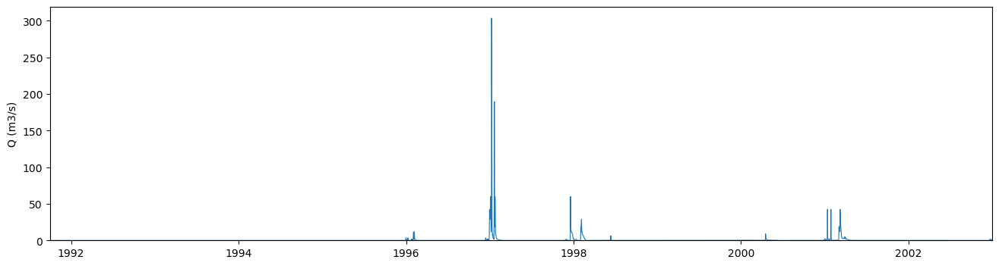

In [72]:
plot_caudal(caudal[stn])

In [73]:
serie = caudal[stn]
fin = estaciones.loc[stn, 'fin']

In [74]:
fin

2003.0

In [75]:
serie.last_valid_index()

Timestamp('2002-12-31 00:00:00')

In [55]:
serie[serie.index.year == fin]

date
2011-01-01   NaN
2011-01-02   NaN
2011-01-03   NaN
2011-01-04   NaN
2011-01-05   NaN
              ..
2011-12-27   NaN
2011-12-28   NaN
2011-12-29   NaN
2011-12-30   NaN
2011-12-31   NaN
Name: 9030, Length: 365, dtype: float64

In [34]:
periodos_ds.sel(id='4207', period='train')

<xarray.DataArray (date: 2)>
array(['1995-10-01T00:00:00.000000000',                           'NaT'],
      dtype='datetime64[ns]')
Coordinates:
  * date     (date) <U5 'start' 'end'
    period   <U10 'train'
    id       <U4 '4207'

In [106]:
period = 'train'
for id in basins[period]:
    print('{0}:\t{1}\t{2}'.format(id,
                                  periodos_dct[period][id]['start_dates'],
                                  periodos_dct[period][id]['end_dates']))

1105:	[Timestamp('2003-10-01 00:00:00')]	[Timestamp('2020-09-30 00:00:00')]
1302:	[Timestamp('2003-10-01 00:00:00')]	[Timestamp('2019-12-31 00:00:00')]
1353:	[Timestamp('2001-10-01 00:00:00')]	[Timestamp('2014-12-31 00:00:00')]
1363:	[Timestamp('1995-10-01 00:00:00')]	[Timestamp('2002-12-31 00:00:00')]
1365:	[Timestamp('1999-10-01 00:00:00')]	[Timestamp('2012-12-31 00:00:00')]
1369:	[Timestamp('1999-10-01 00:00:00')]	[Timestamp('2013-12-31 00:00:00')]
1404:	[Timestamp('1997-10-01 00:00:00')]	[Timestamp('2005-12-31 00:00:00')]
1427:	[Timestamp('2001-10-01 00:00:00')]	[Timestamp('2014-12-31 00:00:00')]
1431:	[Timestamp('2003-10-01 00:00:00')]	[Timestamp('2020-09-30 00:00:00')]
1441:	[Timestamp('2013-10-01 00:00:00')]	[Timestamp('2020-09-30 00:00:00')]
1443:	[Timestamp('2003-10-01 00:00:00')]	[Timestamp('2020-09-30 00:00:00')]
1512:	[Timestamp('2016-10-01 00:00:00')]	[Timestamp('2020-09-30 00:00:00')]
1520:	[Timestamp('2011-10-01 00:00:00')]	[Timestamp('2020-09-30 00:00:00')]
1522:	[Times

In [30]:
periodos_dct['train'][stn]

{'start_dates': [Timestamp('2003-10-01 00:00:00')],
 'end_dates': [Timestamp('2020-09-30 00:00:00')]}

In [22]:
basins['train']

['1105',
 '1302',
 '1353',
 '1363',
 '1365',
 '1369',
 '1404',
 '1427',
 '1431',
 '1441',
 '1443',
 '1512',
 '1520',
 '1522',
 '1542',
 '1544',
 '1546',
 '1578',
 '1605',
 '1619',
 '1620',
 '1622',
 '1638',
 '1659',
 '1723',
 '1725',
 '1726',
 '1728',
 '1753',
 '1823',
 '1824',
 '1829',
 '2000',
 '2012',
 '2013',
 '2025',
 '2026',
 '2028',
 '2030',
 '2031',
 '2041',
 '2043',
 '2046',
 '2049',
 '2050',
 '2053',
 '2055',
 '2057',
 '2061',
 '2074',
 '2081',
 '2089',
 '2098',
 '2101',
 '2105',
 '2113',
 '2114',
 '2115',
 '2116',
 '2121',
 '2125',
 '2126',
 '2131',
 '2138',
 '2139',
 '2144',
 '2145',
 '2147',
 '2156',
 '2163',
 '2712',
 '2713',
 '2716',
 '2717',
 '3005',
 '3014',
 '3040',
 '3045',
 '3049',
 '3052',
 '3062',
 '3161',
 '3165',
 '3169',
 '3174',
 '3180',
 '3184',
 '3186',
 '3198',
 '3200',
 '3212',
 '3213',
 '3220',
 '3222',
 '3231',
 '3234',
 '3235',
 '3242',
 '3244',
 '3246',
 '3253',
 '3268',
 '3279',
 '4207',
 '4212',
 '4214',
 '5045',
 '5050',
 '5056',
 '5107',
 '5123',
 